In [1]:
import numpy as np 
import pandas as pd 
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import re
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB

In [2]:
df = pd.read_csv(r'C:\Users\carte\Downloads\steam_reviews.csv')
df

,Unnamed: 0,app_id,app_name,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,...,steam_purchase,received_for_free,written_during_early_access,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played
0,0,292030,The Witcher 3: Wild Hunt,85185598,schinese,不玩此生遗憾，RPG游戏里的天花板，太吸引人了,1611381629,1611381629,True,0,...,True,False,False,76561199095369542,6,2,1909.0,1448.0,1909.0,1.611343e+09
1,1,292030,The Witcher 3: Wild Hunt,85185250,schinese,拔DIAO无情打桩机--杰洛特!!!,1611381030,1611381030,True,0,...,True,False,False,76561198949504115,30,10,2764.0,2743.0,2674.0,1.611386e+09
2,2,292030,The Witcher 3: Wild Hunt,85185111,schinese,巫师3NB,1611380800,1611380800,True,0,...,True,False,False,76561199090098988,5,1,1061.0,1061.0,1060.0,1.611384e+09
3,3,292030,The Witcher 3: Wild Hunt,85184605,english,"One of the best RPG's of all time, worthy of a...",1611379970,1611379970,True,0,...,True,False,False,76561199054755373,5,3,5587.0,3200.0,5524.0,1.611384e+09
4,4,292030,The Witcher 3: Wild Hunt,85184287,schinese,大作,1611379427,1611379427,True,0,...,True,False,False,76561199028326951,7,4,217.0,42.0,217.0,1.610788e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21747366,21747371,546560,Half-Life: Alyx,65645125,english,Holy balls,1584986704,1584986704,True,0,...,True,False,False,76561197967033932,431,7,432.0,0.0,29.0,1.586628e+09
21747367,21747372,546560,Half-Life: Alyx,65645115,english,"A tripod thing bears down on you, it looks imm...",1584986693,1584986693,True,0,...,False,False,False,76561198046495482,70,10,3296.0,15.0,24.0,1.611080e+09
21747368,21747373,546560,Half-Life: Alyx,65645100,english,Honestly this is the best vr game ever,1584986673,1584986673,True,0,...,True,False,False,76561198176379749,79,17,2654.0,0.0,34.0,1.591634e+09
21747369,21747374,546560,Half-Life: Alyx,65645066,english,Smooth turning is not working right now.\nIt a...,1584986631,1586382422,True,0,...,True,False,False,76561198041763187,140,3,210.0,0.0,12.0,1.589715e+09


In [57]:
data = df[df.language == 'english']
data

,Unnamed: 0,app_id,app_name,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,...,steam_purchase,received_for_free,written_during_early_access,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played
3,3,292030,The Witcher 3: Wild Hunt,85184605,english,"One of the best RPG's of all time, worthy of a...",1611379970,1611379970,True,0,...,True,False,False,76561199054755373,5,3,5587.0,3200.0,5524.0,1.611384e+09
5,5,292030,The Witcher 3: Wild Hunt,85184171,english,"good story, good graphics. lots to do.",1611379264,1611379264,True,0,...,True,False,False,76561198170193529,11,1,823.0,823.0,823.0,1.611379e+09
6,6,292030,The Witcher 3: Wild Hunt,85184064,english,"dis gud,",1611379091,1611379091,True,0,...,True,False,False,76561198119302812,27,2,4192.0,3398.0,4192.0,1.611352e+09
18,18,292030,The Witcher 3: Wild Hunt,85180436,english,favorite game of all time cant wait for the Ne...,1611373086,1611373086,True,0,...,True,False,False,76561198065591528,33,1,23329.0,177.0,23329.0,1.611219e+09
20,20,292030,The Witcher 3: Wild Hunt,85179753,english,Why wouldn't you get this,1611371978,1611371978,True,0,...,True,False,False,76561198996835044,131,2,8557.0,2004.0,8557.0,1.611371e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21747364,21747369,546560,Half-Life: Alyx,65645167,english,best game ever\n,1584986750,1584986750,True,0,...,True,False,False,76561198817267089,86,8,1055.0,14.0,45.0,1.611138e+09
21747366,21747371,546560,Half-Life: Alyx,65645125,english,Holy balls,1584986704,1584986704,True,0,...,True,False,False,76561197967033932,431,7,432.0,0.0,29.0,1.586628e+09
21747367,21747372,546560,Half-Life: Alyx,65645115,english,"A tripod thing bears down on you, it looks imm...",1584986693,1584986693,True,0,...,False,False,False,76561198046495482,70,10,3296.0,15.0,24.0,1.611080e+09
21747368,21747373,546560,Half-Life: Alyx,65645100,english,Honestly this is the best vr game ever,1584986673,1584986673,True,0,...,True,False,False,76561198176379749,79,17,2654.0,0.0,34.0,1.591634e+09


In [58]:
gtav = data[data.app_name == 'Grand Theft Auto V'].copy()
gtav

,Unnamed: 0,app_id,app_name,review_id,language,review,timestamp_created,timestamp_updated,recommended,votes_helpful,...,steam_purchase,received_for_free,written_during_early_access,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played
12750210,12750213,271590,Grand Theft Auto V,84998143,english,It's fun.\nWish the loading times for Online w...,1611091317,1611091317,True,0,...,True,False,False,76561198150307046,21,8,9894.0,51.0,9894.0,1.610902e+09
12750213,12750216,271590,Grand Theft Auto V,84997804,english,hn,1611090858,1611090858,True,0,...,True,False,False,76561199116756419,2,1,1935.0,700.0,1920.0,1.611091e+09
12750214,12750217,271590,Grand Theft Auto V,84997454,english,---{Graphics}---\n☐ You forget what reality is...,1611090369,1611090369,True,0,...,True,False,False,76561198153251963,186,10,34944.0,899.0,34944.0,1.610992e+09
12750216,12750219,271590,Grand Theft Auto V,84996934,english,a,1611089687,1611089687,True,0,...,True,False,False,76561198311729059,16,1,1817.0,549.0,1817.0,1.611089e+09
12750223,12750226,271590,Grand Theft Auto V,84996088,english,It is one of the best games I’ve played.. Too ...,1611088541,1611088541,True,0,...,True,False,False,76561198883017613,9,1,5263.0,0.0,5263.0,1.609456e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13769314,13769318,271590,Grand Theft Auto V,85173004,english,"For me, the best GTA.",1611361204,1611361204,True,1,...,True,False,False,76561198035908252,252,119,10461.0,0.0,10461.0,1.546879e+09
13769316,13769320,271590,Grand Theft Auto V,85172907,english,good,1611361050,1611361050,True,0,...,True,False,False,76561199075560814,2,1,549.0,481.0,154.0,1.611428e+09
13769318,13769322,271590,Grand Theft Auto V,85172707,english,American Truck Simulator = FUN ALL THE TIME!!!!!,1611360718,1611360718,True,0,...,True,False,False,76561198271736760,12,2,3987.0,6.0,3987.0,1.611089e+09
13769322,13769326,271590,Grand Theft Auto V,85172261,english,this game is very fun and freeroam,1611360006,1611360006,True,0,...,True,False,False,76561199049445813,9,1,3070.0,889.0,2988.0,1.611365e+09


In [59]:
gtav = gtav[['review', 'recommended','votes_helpful']]
gtav

,review,recommended,votes_helpful
12750210,It's fun.\nWish the loading times for Online w...,True,0
12750213,hn,True,0
12750214,---{Graphics}---\n☐ You forget what reality is...,True,0
12750216,a,True,0
12750223,It is one of the best games I’ve played.. Too ...,True,0
...,...,...,...
13769314,"For me, the best GTA.",True,1
13769316,good,True,0
13769318,American Truck Simulator = FUN ALL THE TIME!!!!!,True,0
13769322,this game is very fun and freeroam,True,0


In [60]:
gtav['recommended'] = gtav['recommended'].map(lambda x: 1 if x == True else 0)
gtav

C:\Users\carte\AppData\Local\Temp\ipykernel_35556\4057477731.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gtav['recommended'] = gtav['recommended'].map(lambda x: 1 if x == True else 0)


,review,recommended,votes_helpful
12750210,It's fun.\nWish the loading times for Online w...,1,0
12750213,hn,1,0
12750214,---{Graphics}---\n☐ You forget what reality is...,1,0
12750216,a,1,0
12750223,It is one of the best games I’ve played.. Too ...,1,0
...,...,...,...
13769314,"For me, the best GTA.",1,1
13769316,good,1,0
13769318,American Truck Simulator = FUN ALL THE TIME!!!!!,1,0
13769322,this game is very fun and freeroam,1,0


In [61]:
gtav = gtav.dropna(subset=['review'])
gtav

,review,recommended,votes_helpful
12750210,It's fun.\nWish the loading times for Online w...,1,0
12750213,hn,1,0
12750214,---{Graphics}---\n☐ You forget what reality is...,1,0
12750216,a,1,0
12750223,It is one of the best games I’ve played.. Too ...,1,0
...,...,...,...
13769314,"For me, the best GTA.",1,1
13769316,good,1,0
13769318,American Truck Simulator = FUN ALL THE TIME!!!!!,1,0
13769322,this game is very fun and freeroam,1,0


In [62]:
def lowercase(input):
    return input.lower()

def remove_punctuation(input):
    return input.replace('[^\w\s]','')

def tokenize(input):
    return word_tokenize(input)

def remove_stop_words(input):
    input = word_tokenize(input)
    return [word for word in input if word not in stopwords.words('english')]

def lemmatize(input):
    lemmatizer=WordNetLemmatizer()
    input_str=word_tokenize(input)
    new_words = []
    for word in input_str:
        new_words.append(lemmatizer.lemmatize(word))
        return ' '.join(new_words)

def nlp_pipeline(input):
    return lemmatize(' '.join(remove_stop_words(remove_punctuation(lowercase(input)))))

In [63]:
gtav['review'] = gtav['review'].str.lower()
remove_punctuation(gtav['review'])
stop_words = set(stopwords.words('english'))
gtav['review'] = gtav['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
gtav.review = gtav.review.map(lambda x: re.sub(r'[^\w\s]', '', x))
gtav.review = gtav.review.map(lambda x: word_tokenize(x))
word_lemmatizer = WordNetLemmatizer()
gtav.review = gtav.review.map(lambda x: [word_lemmatizer.lemmatize(w) for w in x])
gtav.review = gtav.review.map(lambda x: ' '.join(x))
gtav.head(20)

C:\Users\carte\AppData\Local\Temp\ipykernel_35556\2770629001.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gtav['review'] = gtav['review'].str.lower()
C:\Users\carte\AppData\Local\Temp\ipykernel_35556\2770629001.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gtav['review'] = gtav['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
C:\Users\carte\AppData\Local\Temp\ipykernel_35556\2770629001.py:5: SettingWithCopyWarning: 
A value is trying to be set on a c

,review,recommended,votes_helpful
12750210,fun wish loading time online better also lot h...,1,0
12750213,hn,1,0
12750214,graphic forget reality beautiful good decent b...,1,0
12750216,,1,0
12750223,one best game ive played bad online mode fille...,1,0
12750227,gta best game steam,1,0
12750228,hacker every lobby,0,0
12750230,u,1,0
12750231,trash,0,0
12750234,fun game,1,0


In [84]:
train, test = train_test_split(gtav, test_size=0.2)

train

,review,recommended,votes_helpful
13594423,one best game love it come join darkness creat...,1,2
13296833,great game would best,1,0
13398653,awesome,1,0
13738947,recommend game,1,2
13521155,got ban nice,0,1
...,...,...,...
13706919,graphic masterpiece beautiful good decent bad ...,0,0
13694146,recommended open world game fun,1,1
13709879,best best,1,4
13164869,stop lying,1,0


In [85]:
train.review.count()

255279

In [86]:
test.review.count()

63820

In [87]:
gtavVectorizer_bow = CountVectorizer()
TrainData_Feature = gtavVectorizer_bow.fit_transform(train['review'])
TestData_Feature = gtavVectorizer_bow.transform(test['review'])

In [88]:
NB_classifier = MultinomialNB()
target = np.array(train['recommended'])
NB_classifier.fit(TrainData_Feature, target)

MultinomialNB()

In [89]:
target2 = np.array(test['recommended'])
NB_classifier.score(TestData_Feature, target2)

0.8906298965841429

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


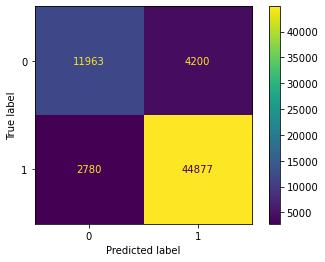

In [90]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(NB_classifier, TestData_Feature, target2) 

In [91]:
prediction = NB_classifier.predict(TestData_Feature)
pos_neg_matrix = [[0,0],
                  [0,0]]
test_arr = np.array(test)
print("The Following data was misclassified")
for i in range(len(test['recommended'])):
    if (test_arr[i][0] == prediction[i]) and (prediction[i] == 0):
        pos_neg_matrix[0][0] += 1
    elif (test_arr[i][0] != prediction[i]) and (prediction[i] == 1):
        print(test_arr[i][0]," (classified as good was bad)")
        pos_neg_matrix[0][1] += 1
    elif (test_arr[i][0] != prediction[i]) and (prediction[i] == 0):
        print(test_arr[i][0]," (classified as bad was good)")
        pos_neg_matrix[1][0] += 1
    elif (test_arr[i][0] == prediction[i]) and (prediction[i] == 1):
        pos_neg_matrix[1][1] += 1
print("\nThe Array is:")
print("              Ham     Spam")
for i in range(2):
    if i == 0:
        print("True (Ham)", end="     ")
    else: 
        print("Label (Spam)", end="   ")
    for j in range(2):
        print(pos_neg_matrix[i][j], end="    ")
    print()
print("            Predicted Outputs")

The Following data was misclassified
dhewettewew  (classified as good was bad)
ti good getting blown every 5 min someone online good  (classified as good was bad)
good game better friend  (classified as good was bad)
fuck taketwo  (classified as bad was good)
really like game  (classified as good was bad)
rockstar game service indescriminately removing game currency legitimate player online try push microtransaction sale year now buying game play offline u favour buy it vote wallet  (classified as bad was good)
fun ƒor ever p  (classified as good was bad)
must gta san andreas player  (classified as good was bad)
email  (classified as bad was good)
like  (classified as good was bad)
pretty good overall problem long download time enjoyable  (classified as good was bad)
  (classified as good was bad)
always fav game ther single errorcons running on 4770k i7 asus nvidia titan 6gb 8gb kingston hyperx ram intel 265 ssd hard drive running smooth day one 10010  (classified as good was bad)
cha

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



  (classified as bad was good)
good game loading take much tim  (classified as good was bad)
gta ofc  (classified as good was bad)
pro it modern gta game pc update still pushed title gta online many possibility fun friend heist silly fun activity like golf race much more con hackersmodders to lesser extent griefers much prevalent pc console player may different experience used to playing friend activity requires public lobby might better switch private lobby learn isolate oneself public lobby  (classified as good was bad)
game bad enough every update online shark card bait even modders fun single player shame you rockstar take two interactive  (classified as bad was good)
50 onley loading  (classified as good was bad)
good good ya know player etc  (classified as good was bad)
good  (classified as good was bad)
  (classified as good was bad)
need update  (classified as good was bad)
awesome far  (classified as good was bad)
fantastic game solid gameplay incredibly self aware story howev

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [92]:
from sklearn import svm
clf = svm.SVC()
clf.fit(TrainData_Feature[:10000], train.recommended[:10000])

SVC()

In [93]:
predictions = clf.predict(TestData_Feature[:10000])

In [94]:
tp, fp, tn, fn = (0,0,0,0)
for p, t in zip(predictions, test.recommended[:10000]):
    if t == 1:
        if p == 1:
            tp += 1
        else:
            fn += 1
    else:
        if p == 0:
            tn += 1
        else:
            fp += 1
count = len(predictions)
print('TP:', tp/count)
print('TN:', tn/count)
print('FP:', fp/count)
print('FN:', fn/count)

TP: 0.7103
TN: 0.1491
FP: 0.1009
FN: 0.0397


In [75]:
from sklearn.feature_extraction.text import TfidfVectorizer
gtavVectorizer_tfidf = TfidfVectorizer() 
TrainData_Feature = gtavVectorizer_tfidf.fit_transform(train['review'])
TestData_Feature = gtavVectorizer_tfidf.transform(test['review'])

In [76]:
from sklearn.naive_bayes import MultinomialNB
NB_classifier = MultinomialNB()

In [77]:
target_train = np.array(train['recommended'])
NB_classifier.fit(TrainData_Feature, target_train)

MultinomialNB()

In [78]:
target_test = np.array(test['recommended'])
NB_classifier.score(TestData_Feature, target_test)

0.8824506424318396

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


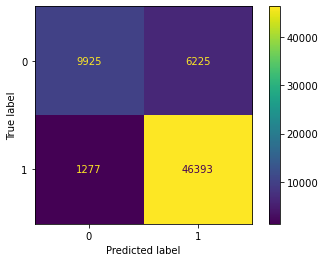

In [79]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(NB_classifier, TestData_Feature, target2)

In [80]:
prediction = NB_classifier.predict(TestData_Feature)
pos_neg_matrix = [[0,0],
                  [0,0]]
test_arr = np.array(test)
print("The Following data was misclassified")
for i in range(len(test['recommended'])):
    if (test_arr[i][0] == prediction[i]) and (prediction[i] == 0):
        pos_neg_matrix[0][0] += 1
    elif (test_arr[i][0] != prediction[i]) and (prediction[i] == 1):
        print(test_arr[i][0]," (classified as good was bad)")
        pos_neg_matrix[0][1] += 1
    elif (test_arr[i][0] != prediction[i]) and (prediction[i] == 0):
        print(test_arr[i][0]," (classified as bad was good)")
        pos_neg_matrix[1][0] += 1
    elif (test_arr[i][0] == prediction[i]) and (prediction[i] == 1):
        pos_neg_matrix[1][1] += 1
print("\nThe Array is:")
print("              Ham     Spam")
for i in range(2):
    if i == 0:
        print("True (Ham)", end="     ")
    else: 
        print("Label (Spam)", end="   ")
    for j in range(2):
        print(pos_neg_matrix[i][j], end="    ")
    print()
print("            Predicted Outputs")

The Following data was misclassified
great singleplayer terrible multiplayer  (classified as good was bad)
difficulty 90 year old grandma could play easy normal hard dark soul graphic m paint bad meh graphic dont matter game good beautiful music bad special good eargasm story game story like playing temple runner story people want well written epic story price free underpriced perfect price could cheaper overpriced complete waste money requirement run microwave average high end nasa computer length short 0 3 hour short 3 15 hour average 1550 hour long 5090 hour extremely long 90110 hour ending fun id rather watch paint dry hard enjoy repetitive actually pretty amusing ride life replayability onetime experience achievement wait monthsyears definitely infinitely replayable worth buying wait sale yes grand theft auto v amazing game really deserve credit receives singleplayer story phenomenal thrilling choose story ending character wellexplored background end game provide insight would lik

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



asaba grikrgro awe roike koefgopkoeidksfpoasdjfkvoilpsdfvjmsiokludfvjmsaiokledfvjkusoipedfvjksoliedfcjsloikzdejfioaikskfdopaospdoapåsfoapåsfoopsdgikosmoikcvjksioxjcvio9judci98o0iuojadiuofjapwijdiowjdioajwdioajswdioajslkjioudfjsodipgujhoijdioawjusoijedtuiajwsdiuahauishdjuiahfeuiaehuijfjhneuyijfhiuwdhaiuowsdhaiuwsodhiwuoahsoijdhiuwaoshjdhwoiuashfeuysuhdjfdoskfjdfsdfdfsdfisdiofkpiosdfgjioujkdfghjniujksfdjsiusiudfhy gtiushr ghrodrfgyhduirg dyidugyhiugyoiduyfoigyy gtiushr ghrodrfgyhduirg  (classified as good was bad)
addicting fun well honest thing hate game take long load load little bit slow gta v mission cool too movie lol gta online really fun except ppl really tryna ruin fun online game like that overall love game highly recommended  (classified as good was bad)
money hungry owner  (classified as bad was good)
so taketwo decided kill openiv curb cheating software devs utmost best make sure mod made openiv could work online solo mode openiv since around 2008 gta iv staple gta modding co

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [81]:
from sklearn import svm
clf = svm.SVC()
clf.fit(TrainData_Feature[:10000], train.recommended[:10000])

SVC()

In [82]:
predictions = clf.predict(TestData_Feature[:10000])

In [83]:
tp, fp, tn, fn = (0,0,0,0)
for p, t in zip(predictions, test.recommended[:10000]):
    if t == 1:
        if p == 1:
            tp += 1
        else:
            fn += 1
    else:
        if p == 0:
            tn += 1
        else:
            fp += 1
count = len(predictions)
print('TP:', tp/count)
print('TN:', tn/count)
print('FP:', fp/count)
print('FN:', fn/count)

TP: 0.7179
TN: 0.1684
FP: 0.0833
FN: 0.0304
